In [7]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.util import montage
from skimage.morphology import disk, erosion
from skimage.measure import regionprops, regionprops_table, label
from numpy.matlib import repmat
import pandas as pd

In [38]:
def Get_flower_data (img_file,radius,h,minArea,maxArea,mindist,R,G,B):
    
    filename = img_file
    image = imread(filename)
    (imHeight,imWidth,imDepth) = image.shape
    image_copy = image
    
    # % Detect yellow pixels
    # % Red and Green have a high value, but Blue has a low value
    # lower = np.array((200, 200, 0), dtype = "uint8")
    # upper = np.array((255, 255, 20), dtype = "uint8")
    imageBWyellow = np.ones((imHeight,imWidth), np.uint8)
    imageBWyellow[:, :] = ((image_copy[:, :, 0] >= R) & (image_copy[:, :, 1] >= G) & (image_copy[:, :, 2] <= B)) * 255 
    
    # figure
    plt.figure(figsize=(20,40))
    plt.imshow(imageBWyellow, cmap=plt.cm.gray)
    plt.title('Yellow pixels')  
    
    radius = radius; #% THIS PARAMETER MAY BE TUNED FOR I-PHONE VS DRONE IMAGES
    SE = disk(radius, dtype=np.uint8)
    labeledYellow = label(imageBWyellow)
    statsYellow = regionprops(labeledYellow)
    
    statsYellowTable = regionprops_table(labeledYellow, properties=('area', 'centroid'))
    df_statsYellow = pd.DataFrame.from_dict(statsYellowTable)
    histEdges = range(1,200)
    df_statsYellow['color'] = repmat("yellow", len(statsYellow), 1)
    statsAll =  pd.concat([df_statsYellow])
    
    discarded = 0
    h = h;         #% THIS PARAMETER DETERMINES SIZE OF SMALL IMAGES (64 x 64)
    minArea = minArea;    #% Minimum area of colored pixels TUNE THIS PARAMETER
    maxArea = maxArea; #% To remove the large white disks
    mindist = mindist;   #% Minimum distance between two flowers TUNE THIS PARAMETER
    yellowFlowerImages = list()
    nrYellowFlowers = 0;
    sortedAll = statsAll.sort_values(by=['area'],axis=0,ascending=False); #% Sort the areas on area size
    imageMask = np.zeros((imHeight,imWidth), np.bool8); #% Black image of same size as original image
    
    # figure    
    plt.figure(figsize=(20,40))
    plt.imshow(image)
          
    for index, row in sortedAll.iterrows():
        y = int(row['centroid-1']); #% 1 <= y <= imWidth
        x = int(row['centroid-0']); #% 1 <= x <= imHeight
        area = row['area']
        color = row['color']
        if (x > h) & (y > h) & (x < (imHeight - h)) & (y < (imWidth - h)) & (area >= minArea) & (area <= maxArea):
            # % Possible flower detected
            # % fprintf('Possible flower at x = %d, y = %d, mask = %s\n',x,y,mat2str(imageMask(x,y)))
                if imageMask[x][y] == False:
                # % Flower detected
                # % Create white circle in mask image of radius mindist
                    for i in range(x-mindist,x+mindist):
                        for j in range(y-mindist,y+mindist):
                            if ((i-x)**2 + (j-y)**2) <= mindist**2:
                                    imageMask[i][j] = True;

                    if color == "yellow":
                    # % Place area size in original image
                        plt.text(y+10,x, s=str(area),color='yellow')
                        nrYellowFlowers = nrYellowFlowers + 1
                        yellowFlowerImages.append(image[x-h:x+h,y-h:y+h,:])
                else:
                    discarded += 1
        else:
            discarded += 1
                    
    #Show the series of detected flowers/objects
    yellowFlowerImagesArray = np.array(yellowFlowerImages)
    allYellowFlowers = montage(yellowFlowerImagesArray, multichannel=True)
    plt.figure(figsize=(40,40))
    plt.imshow(allYellowFlowers)
    plt.title(print('Number of yellow flowers %d',nrYellowFlowers))       
    
    return yellowFlowerImages

Number of yellow flowers %d 326


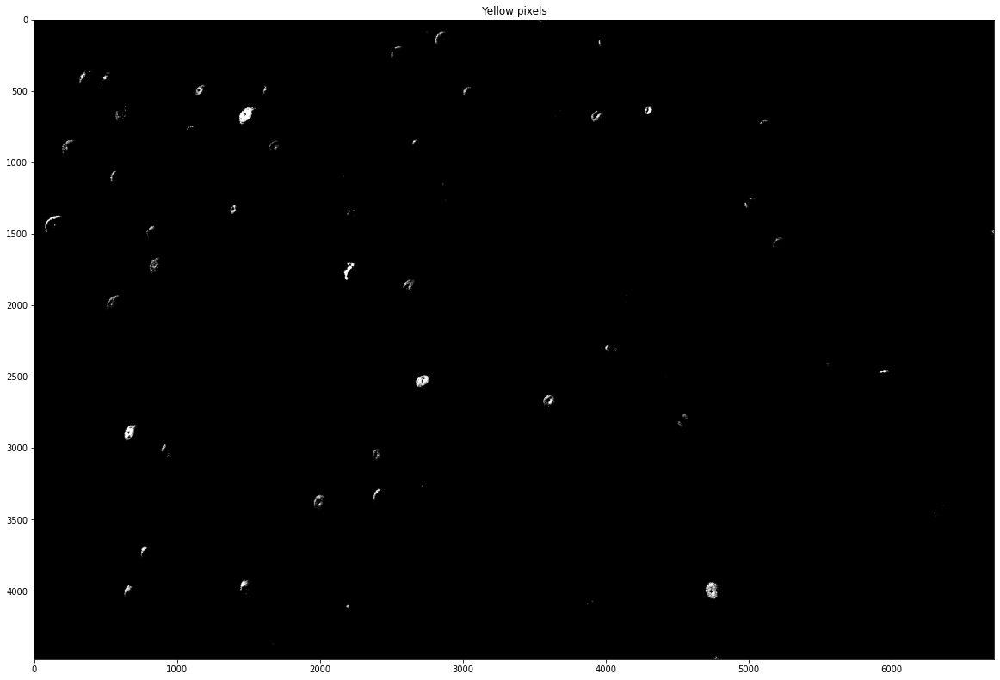

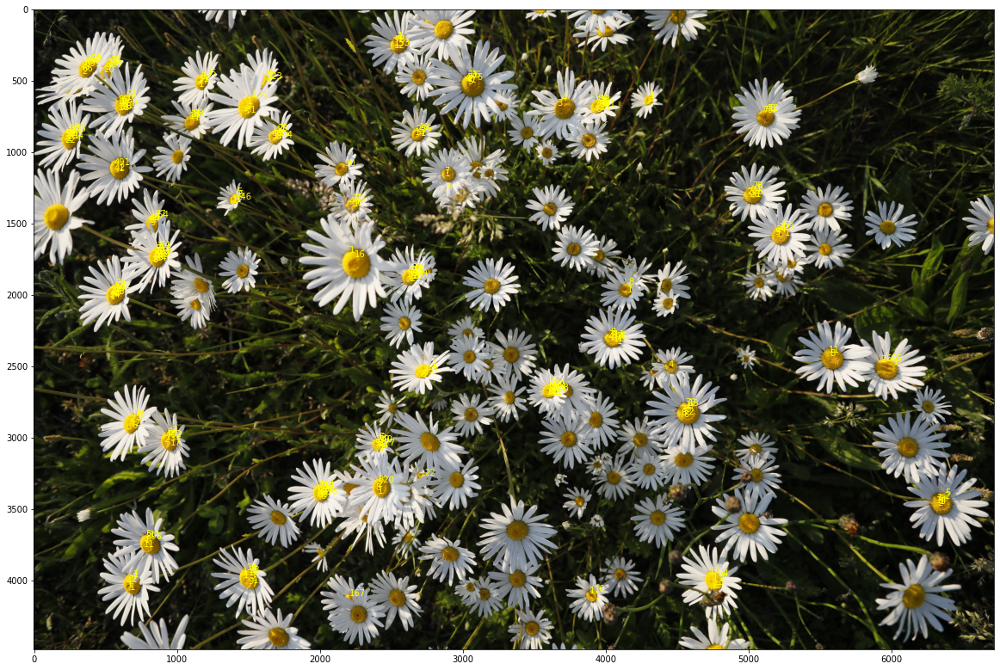

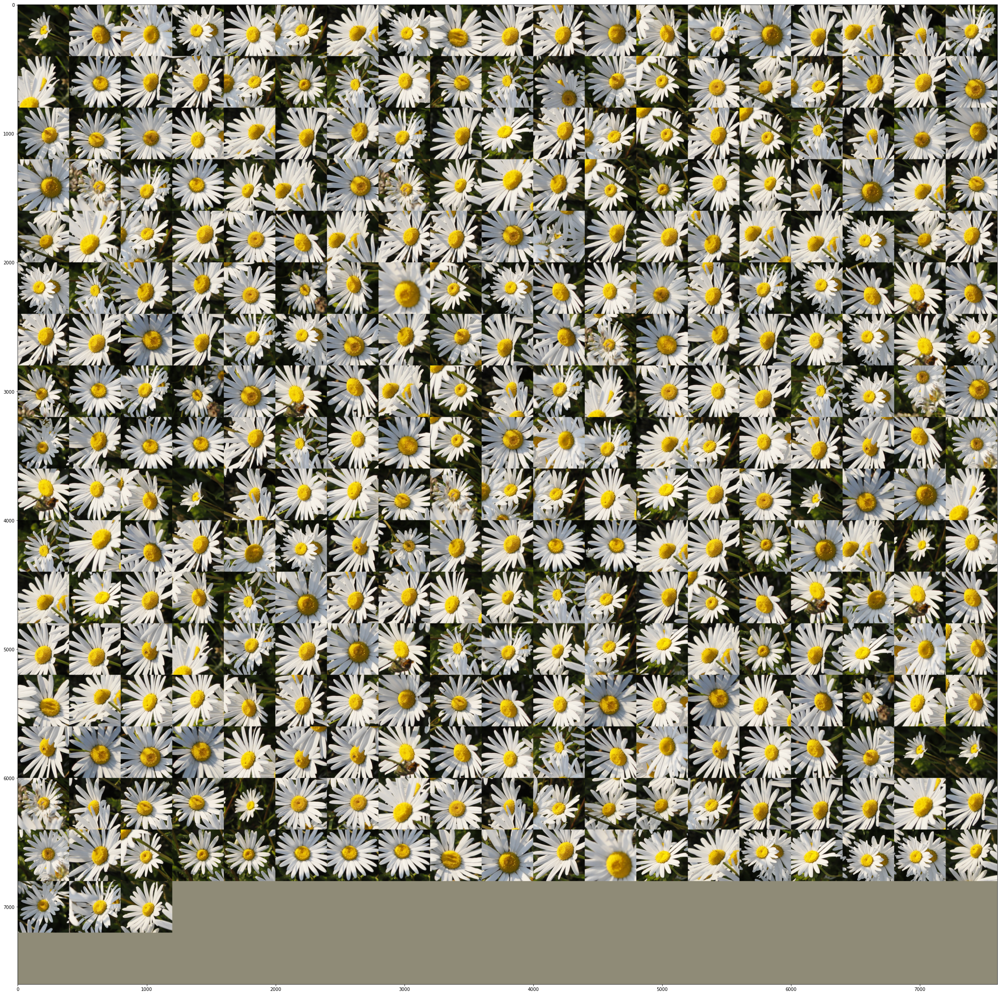

In [40]:
data = r'C:\Users\Philip Vangelov\Desktop\ADS - Minor\Flower Power\Flower Project 2021\FL_RawData\Eindhoven_Flower_DataSet_2021\test\_B4A6392.jpg'
default_radius = 3
default_h = 200
default_minArea = 1
default_maxArea = 1000
default_mindist = 15

#Chose color to detect

R = 200
G = 200
B = 20

boba = Get_flower_data(data,
                       default_radius,
                       default_h,
                       default_minArea,
                       default_maxArea,
                       default_mindist,
                       R,G,B)



In [ ]:
def Download_data(boba,location,flower_name,flower_id,file_type):
    
    yellowFlowerImagesArray = np.array(boba)
    allYellowFlowers = montage(yellowFlowerImagesArray, multichannel=True)
    
    filepath = location
    filepathYellow = os.path.join(filepath + '\YellowFlowers')
    os.mkdir(filepathYellow)
    
    for i in range(len(yellowFlowerImagesArray)):
    filenameYellow = flower_name+str(i)+flower_id+file_type
    filetowriteYellow = os.path.join(filepathYellow,filenameYellow)
    cv2.imwrite(filetowriteYellow,cv2.cvtColor(yellowFlowerImagesArray[i], cv2.COLOR_RGB2BGR))

In [2]:
BOBA =[]